In [ ]:
%run init_notebook.py

import os
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torchaudio.transforms as T
import time
import torchaudio
from tqdm import tqdm
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
from IPython.display import Audio, display

from src.dataset_cVAE import NSynth   
from src.latent_models import latent_AutoEncoder
from src.utils.dataset import load_raw_waveform
from src.utils.logger import save_training_results
from src.utils.models import compute_magnitude_and_phase

from src.paths import PATHS

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = PATHS['autoencoder_2D']['model']

mse_loss = nn.MSELoss()

# STFT transform
sample_rate = 16000
n_fft = 4000 # Small n_fft: good time resolution, poor frequency resolution. Large n_fft: good frequency resolution, poor time resolution.
hop_length = 300
win_length = n_fft  # Same as n_fft

# Apply the correct transform for magnitude and phase (onesided=False to handle complex spectrogram)
stft_transform = T.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    power=None,  # Keep as complex spectrogram (magnitude and phase)
    onesided=False,  # Make sure we keep the full spectrum (complex-valued)
    center=False
).to(device)

# Define the inverse STFT function (onesided=False)
istft_transform = torchaudio.transforms.InverseSpectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    onesided=False  # Make sure we reconstruct using the full complex spectrogram
).to(device)

# Datasets and DataLoaders, training parameters.
train_dataset = NSynth(partition='training')
valid_dataset = NSynth(partition='validation')
test_dataset  = NSynth(partition='testing')

batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)

input_height = 4000 # = n_fft because onesided=False
input_width  = 201 # = 1 + floor((T - n_ftt) / hop_length), where T is the whole duration (4 * 16000 = 64000)
latent_dim   = 200 # TODO seguramente deba cambiarlo a 8
channels = [2, 16, 32, 64]
learning_rate = 1e-4

model = latent_AutoEncoder((input_height, input_width), latent_dim, channels).to(device)
def spectral_loss(pred, target):
    # Separar canales (asumiendo canal 0=Mag, canal 1=Fase)
    pred_mag, pred_phase = pred[:, 0], pred[:, 1]
    target_mag, target_phase = target[:, 0], target[:, 1]
    
    # 1. Error de Magnitud (Log MSE) - Esto da la nitidez
    loss_mag = mse_loss(pred_mag, target_mag)
    
    # 2. Error de Fase "Circular"
    # Esto calcula la diferencia más corta en el círculo trigonométrico
    # 1 - cos(pred - target) es 0 si son iguales, y sube si se alejan
    loss_phase = torch.mean(1 - torch.cos(pred_phase - target_phase))
    
    # Suma ponderada (Damos más peso a la magnitud pq es más importante)
    return loss_mag + 0.5 * loss_phase

if os.path.exists(model_path):
    try:
        model.load_state_dict(torch.load(model_path))
        print("Model loaded successfully.")
    except PermissionError as e:
        print(f"PermissionError: {e}. Unable to load the model.")
else:
    print("No saved model found, starting training from scratch.")

    # Model, Optimizer, and Loss
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss().to(device)

    # Training Loop
    num_epochs = 30
    log_interval = 10
    avg_epoch_time = 0.0

    training_losses = []
    validation_losses = []

    # Learning rate scheduler to reduce learning rate based on validation loss
    scheduler = ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5)
    

    print(f"Starting training on {device}...")
    for epoch in range(num_epochs):
        model.train()
        start_epoch_time = time.time()
        train_loss = 0.0
        pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", unit="batch")

        # Training Loop
        for i, (waveform, _, _, _) in enumerate(pbar):
            # waveform has shape [batch_size, 1, time_steps]

            waveform = waveform.to(device)

            # Apply STFT transformation
            stft_spec = stft_transform(waveform)  # [batch_size, 1, freq_bins, time_frames]

            # Extract magnitude and phase
            mag, phase = compute_magnitude_and_phase(stft_spec)
            #aplicar logaritmo a la magnitud
            log_magnitude = torch.log1p(mag)
            
            #juntar magnitud (log) y fase
            x = torch.cat([log_magnitude, phase], dim=1).to(device)
            #input_data = torch.cat([magnitude, phase], dim=1).to(device)  # [batch_size, 2, freq_bins, time_frames]

            optimizer.zero_grad()
            output = model(x)  # shape [batch_size, 2, freq_bins, time_frames]
            #loss = criterion(output, input_data)
            loss = spectral_loss(output, x)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * waveform.size(0)
            pbar.set_postfix({'batch loss': loss.item(), 'train loss': train_loss /( pbar.n + 1)})

            

        # Compute average epoch loss for training
        train_loss /= len(train_loader.dataset)

        # Validation Loop
        model.eval()
        valid_loss = 0.0
        with torch.no_grad():
            for i, (waveform, _, _, _) in enumerate(valid_loader):
                waveform = waveform.to(device)
                stft_spec = stft_transform(waveform)
                # Extract magnitude and phase
                mag, phase = compute_magnitude_and_phase(stft_spec)
                
                log_magnitude = torch.log1p(mag)
                x = torch.cat([log_magnitude, phase], dim=1).to(device) # [Batch, 2, Freq, Time]
              #  input_data = torch.cat([magnitude, phase], dim=1).to(device)

                output = model(x)
                loss = criterion(output, x)
                valid_loss += loss.item() * x.size(0)

        # Compute average validation loss
        valid_loss /= len(valid_loader.dataset)
        
        # Step the scheduler with validation loss
        scheduler.step(valid_loss)

        epoch_time = time.time() - start_epoch_time
        avg_epoch_time += epoch_time
        training_losses.append(train_loss)
        validation_losses.append(valid_loss)

        print(f"Epoch {epoch+1}, train_loss={train_loss}, valid_loss={valid_loss}, Time: {epoch_time:.2f}s")
            
    print("Training complete. Saving results...")

    save_training_results({
        "train_loss": training_losses,
        "valid_loss": validation_losses,
        "num_epochs": num_epochs,
        "avg_epoch_time": avg_epoch_time / num_epochs,
        "learning_rate": learning_rate,
        "batch_size": batch_size,
        "sample_rate": sample_rate,
        "n_fft": n_fft,
        "hop_length": hop_length,
        "input_height": input_height,
        "input_width": input_width,
        "latent_dim": latent_dim,
    }, "autoencoder.json")

    torch.save(model.state_dict(), model_path)
    # Plot training and validation losses
    import matplotlib.pyplot as plt
    epochs = range(1, num_epochs + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, training_losses, label='Training Loss', marker='o')
    plt.plot(epochs, validation_losses, label='Validation Loss', marker='x')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training vs Validation Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()




Carga completada: 289205 muestras de todos los instrumentos.
Carga completada: 12678 muestras de todos los instrumentos.
Carga completada: 4096 muestras de todos los instrumentos.
Model loaded successfully.


### Reconstruction Accuracy

The **reconstruction accuracy** for each sample is computed as:

$$
\text{Accuracy}_i = \max \left(0, 1 - \frac{\lVert x_i - \hat{x}_i \rVert_2^2}{\lVert x_i \rVert_2^2 + \varepsilon} \right) \times 100\%
$$

where:
- $x_i$ is the input for sample $i$ (of shape `[batch_size, 2, num_freq, time_frames]`),
- $\hat{x}_i$ is the reconstructed output from the model,
- $\lVert \cdot \rVert_2^2$ denotes the squared L2 norm (i.e., the sum of squared elements),
- $\varepsilon$ is a small constant to avoid division by zero.

This gives a value between 0% and 100% for each sample.

---

### Total Accuracy

To compute the **overall accuracy** across all samples in the dataset (or batch-wise using a DataLoader), we take the average of all per-sample accuracies:

$$
\text{Total Accuracy} = \frac{1}{N} \sum_{i=1}^{N} \text{Accuracy}_i
$$

where $N$ is the total number of samples evaluated.

This metric tells us how well the model reconstructs the inputs **on average** over the dataset.


In [2]:
def reconstruction_accuracy(x, x_hat):
    # Compute per-sample accuracy tensor of shape [B]
    numerator = torch.sum((x - x_hat) ** 2, dim=(1, 2, 3))
    denominator = torch.sum(x ** 2, dim=(1, 2, 3)) + 1e-8
    accuracy = 1 - numerator / denominator
    return torch.clamp(accuracy, min=0.0, max=1.0)


model.eval()
total_acc_sum = 0.0
total_samples = 0

with torch.no_grad():
    for (waveform, _, _, _) in test_loader:
        raw_waveform = waveform.to(device)  # shape: [B, 1, T]

        stft_spec = stft_transform(raw_waveform)
        mag, phase = compute_magnitude_and_phase(stft_spec)
        input = torch.cat([mag, phase], dim=1)

        output = model(input)

        batch_acc = reconstruction_accuracy(input, output)  # shape: [B]
        total_acc_sum += batch_acc.sum().item()
        total_samples += waveform.size(0)

test_accuracy = round((total_acc_sum / total_samples) * 100, 2)
print(f"Testing accuracy: {test_accuracy}%")

Testing accuracy: 13.71%


In [3]:
# --------------------------
# Audio Playback
# --------------------------
import numpy as np
import librosa 


model.eval()

# Samples to compare
test_indices = [random.choice(range(len(test_dataset))) for _ in range(10)]
#pruebas STFT ISTFT
#CUANDO CAMBIE EL MODELO PONER NUMEROS Q SEAN MULTIPLOS
baseline_stft = T.Spectrogram(
    n_fft=512,
    win_length=512,
    hop_length=128,
    power=None,
    onesided=False,
    center=False
).to(device)

baseline_istft = torchaudio.transforms.InverseSpectrogram(
    n_fft=512,
    win_length=512,
    hop_length=128,
    onesided=False
).to(device)
 
# Usar Griffin-Lim para reconstruir
griffin_lim = torchaudio.transforms.GriffinLim(
    n_fft=4000,        # Usa el mismo n_fft que en tu STFT
    hop_length=300,    # Usa el mismo hop_length
    n_iter=32          # 32 iteraciones suele bastar para buena calidad
).to(device)
    


for idx in test_indices:
    print(f"\n=== Test sample index: {idx} ===")
    # (stft_spec, sample_rate, key, metadata) from dataset; here we only need key and sample_rate
    _, sample_rate, key, metadata = test_dataset[idx]

    # Listen to the Original Audio with no transform applied
    raw_waveform, raw_sr = load_raw_waveform("testing", key)
    print(f"Key: {key}")
    print("Original audio:")
    display(Audio(raw_waveform.numpy(), rate=raw_sr))

    # Ensure raw_waveform has a batch and channel dimension, expected shape: [batch, 1, time_steps]
    if raw_waveform.ndim == 2:  # e.g., [1, time_steps]
        raw_waveform = raw_waveform.unsqueeze(0)
    
    raw_waveform = raw_waveform.to(device)

    # Apply STFT transformation
    stft_spec = stft_transform(raw_waveform)  # [batch, 1, freq_bins, time_frames]
    
    # Extract magnitude and phase using the helper function
    mag, phase = compute_magnitude_and_phase(stft_spec)  # both: [batch, 1, freq_bins, time_frames]
    
    x = torch.cat([mag, phase], dim=1).to(device) # <--- PARA MODELO VIEJO (LINEAL). el q no usa log en el entrenamiento
    input_log_magnitude = torch.log1p(mag)
    #input_data = torch.cat([input_log_magnitude, phase], dim=1).to(device)
    
   # input_data = torch.cat([magnitude, phase], dim=1).to(device)
    
    # Reconstruct using the model
    with torch.no_grad():
        output_data = model(x)  # shape: [batch, 2, freq_bins, time_frames]
    
    pred_log_magnitude = output_data[:, 0, :, :]
    
    # Si el valor máximo es pequeño (< 20), asumimos que es Log y aplicamos expm1.
    # Si es gigante (> 20), asumimos que ya es lineal y NO aplicamos expm1 para evitar Infs.
    if pred_log_magnitude.max() < 20:
        pred_magnitude = torch.expm1(pred_log_magnitude)
    else:
        pred_magnitude = pred_log_magnitude
        
    # Split the network output into magnitude and phase
    recon_magnitude = output_data[:, 0, :, :]  # [batch, freq_bins, time_frames]
    recon_phase = output_data[:, 1, :, :]      # [batch, freq_bins, time_frames]

    # Recombine into a complex spectrogram
    recon_complex = recon_magnitude * torch.exp(1j * recon_phase)
    
    # GRIFFIN-LIM PRUEBA
    #pred_log_magnitude = output_data[:, 0, :, :] # Coge solo la magnitud
    #pred_magnitude = torch.expm1(pred_log_magnitude)
    
    n_freqs_correctas = 4000 // 2 + 1 
    pred_magnitude_fix = pred_magnitude[:, :n_freqs_correctas, :]
    #pred_magnitude = torch.expm1(pred_log_magnitude) # Deshacer el logaritmo
    umbral_silencio = 0.02 * pred_magnitude_fix.max()
    pred_magnitude_fix = torch.where(
        pred_magnitude_fix < umbral_silencio, 
        torch.zeros_like(pred_magnitude_fix), 
        pred_magnitude_fix
    )
    print(f"Tamaño Magnitud Original: {mag.shape}")
    print(f"Tamaño Salida Modelo:     {output_data.shape}")
    # 2. EL FIX: Cortamos para quedarnos solo con las 2001 frecuencias útiles
    # n_fft=4000 -> n_freqs = 2001
    #n_freqs_correctas = 4000 // 2 + 1  # Esto da 2001
    #pred_magnitude_fix = pred_magnitude[:, :n_freqs_correctas, :]
    
    reconstructed_waveform = griffin_lim(pred_magnitude_fix)

  
    rec_np = reconstructed_waveform.squeeze().cpu().numpy() 
    rec_np = np.nan_to_num(rec_np)
    max_val = np.abs(rec_np).max()
    if max_val > 0:
        rec_np = rec_np / max_val
    print("Reconstructed audio (Griffin-Lim):")
    display(Audio(rec_np, rate=raw_sr))
    # Apply the inverse STFT transformation to get the waveform
    #reconstructed_waveform = istft_transform(recon_complex)  # [batch, time_steps]
    #comprobacion stft->istft sin modelo para ver si el problema esta en la red 
   
    baseline_complex = mag * torch.exp(1j*phase)
    baseline_waveform = istft_transform(baseline_complex)
    print("Baseline (STFT -> ISTFT sin modelo):")
    display(Audio(baseline_waveform.squeeze().cpu().numpy(), rate=raw_sr))
    
     # baseline sin modelo, con nueva config
    baseline_spec = baseline_stft(raw_waveform)
    mag_b, phase_b = compute_magnitude_and_phase(baseline_spec)
    baseline_complex = mag_b * torch.exp(1j * phase_b)
    baseline_waveform = baseline_istft(baseline_complex)
    print("Baseline STFT->ISTFT (512/128):")
    display(Audio(baseline_waveform.squeeze().cpu().numpy(), rate=raw_sr))
    """
    audio: array 1D con la onda (nuestra waveform)
    threshold: umbral de salto brusco entre muestras, si pasamos d un valor a otro muy rapido (0.6 en este caso), lo consideramos posible click
    """
    def detect_clicks(audio, threshold=0.6):
        diffs = np.abs(np.diff(audio))  #np.diff calcula la diferencia entre muestras consecutivas. diffs es un array q t dice q tan brusco es el cambio entre cada par d muestras
        click_indices = np.where(diffs > threshold)[0]
        return click_indices

    reconstructed_waveform = istft_transform(recon_complex)  # [batch, time_steps]

    rec_np = reconstructed_waveform.squeeze().cpu().numpy()
    #detectar clicks
    clicks = detect_clicks(rec_np, threshold=0.6)
    print(f"clicks detectados: {len(clicks)}")
    if len(clicks) > 0:
        print("Primeros clicks:", clicks[:10])
    print("Reconstructed audio:")
    display(Audio(rec_np, rate=raw_sr))
    print("Reconstructed audio:")
    display(Audio(reconstructed_waveform.squeeze().cpu().numpy(), rate=raw_sr))
   



=== Test sample index: 3317 ===
Key: brass_acoustic_046-075-075
Original audio:


Tamaño Magnitud Original: torch.Size([1, 1, 4000, 201])
Tamaño Salida Modelo:     torch.Size([1, 2, 4000, 201])
Reconstructed audio (Griffin-Lim):


Baseline (STFT -> ISTFT sin modelo):


Baseline STFT->ISTFT (512/128):


clicks detectados: 0
Reconstructed audio:


Reconstructed audio:



=== Test sample index: 1291 ===
Key: organ_electronic_028-056-075
Original audio:


Tamaño Magnitud Original: torch.Size([1, 1, 4000, 201])
Tamaño Salida Modelo:     torch.Size([1, 2, 4000, 201])
Reconstructed audio (Griffin-Lim):


Baseline (STFT -> ISTFT sin modelo):


Baseline STFT->ISTFT (512/128):


clicks detectados: 0
Reconstructed audio:


Reconstructed audio:



=== Test sample index: 1951 ===
Key: keyboard_electronic_002-037-050
Original audio:


Tamaño Magnitud Original: torch.Size([1, 1, 4000, 201])
Tamaño Salida Modelo:     torch.Size([1, 2, 4000, 201])
Reconstructed audio (Griffin-Lim):


Baseline (STFT -> ISTFT sin modelo):


Baseline STFT->ISTFT (512/128):


clicks detectados: 0
Reconstructed audio:


Reconstructed audio:



=== Test sample index: 1332 ===
Key: bass_electronic_027-028-050
Original audio:


Tamaño Magnitud Original: torch.Size([1, 1, 4000, 201])
Tamaño Salida Modelo:     torch.Size([1, 2, 4000, 201])
Reconstructed audio (Griffin-Lim):


Baseline (STFT -> ISTFT sin modelo):


Baseline STFT->ISTFT (512/128):


clicks detectados: 0
Reconstructed audio:


Reconstructed audio:



=== Test sample index: 1141 ===
Key: keyboard_acoustic_004-039-075
Original audio:


Tamaño Magnitud Original: torch.Size([1, 1, 4000, 201])
Tamaño Salida Modelo:     torch.Size([1, 2, 4000, 201])
Reconstructed audio (Griffin-Lim):


Baseline (STFT -> ISTFT sin modelo):


Baseline STFT->ISTFT (512/128):


clicks detectados: 0
Reconstructed audio:


Reconstructed audio:



=== Test sample index: 4 ===
Key: flute_acoustic_002-077-100
Original audio:


Tamaño Magnitud Original: torch.Size([1, 1, 4000, 201])
Tamaño Salida Modelo:     torch.Size([1, 2, 4000, 201])
Reconstructed audio (Griffin-Lim):


Baseline (STFT -> ISTFT sin modelo):


Baseline STFT->ISTFT (512/128):


clicks detectados: 0
Reconstructed audio:


Reconstructed audio:



=== Test sample index: 3601 ===
Key: guitar_acoustic_021-053-075
Original audio:


Tamaño Magnitud Original: torch.Size([1, 1, 4000, 201])
Tamaño Salida Modelo:     torch.Size([1, 2, 4000, 201])
Reconstructed audio (Griffin-Lim):


Baseline (STFT -> ISTFT sin modelo):


Baseline STFT->ISTFT (512/128):


clicks detectados: 0
Reconstructed audio:


Reconstructed audio:



=== Test sample index: 291 ===
Key: flute_synthetic_000-072-050
Original audio:


Tamaño Magnitud Original: torch.Size([1, 1, 4000, 201])
Tamaño Salida Modelo:     torch.Size([1, 2, 4000, 201])
Reconstructed audio (Griffin-Lim):


Baseline (STFT -> ISTFT sin modelo):


Baseline STFT->ISTFT (512/128):


clicks detectados: 0
Reconstructed audio:


Reconstructed audio:



=== Test sample index: 80 ===
Key: guitar_acoustic_014-025-127
Original audio:


Tamaño Magnitud Original: torch.Size([1, 1, 4000, 201])
Tamaño Salida Modelo:     torch.Size([1, 2, 4000, 201])
Reconstructed audio (Griffin-Lim):


Baseline (STFT -> ISTFT sin modelo):


Baseline STFT->ISTFT (512/128):


clicks detectados: 0
Reconstructed audio:


Reconstructed audio:



=== Test sample index: 709 ===
Key: guitar_electronic_022-029-050
Original audio:


Tamaño Magnitud Original: torch.Size([1, 1, 4000, 201])
Tamaño Salida Modelo:     torch.Size([1, 2, 4000, 201])
Reconstructed audio (Griffin-Lim):


Baseline (STFT -> ISTFT sin modelo):


Baseline STFT->ISTFT (512/128):


clicks detectados: 0
Reconstructed audio:


Reconstructed audio:


=== INICIANDO COMPARATIVA: FASE APRENDIDA vs GRIFFIN-LIM ===

Test sample index: 1899


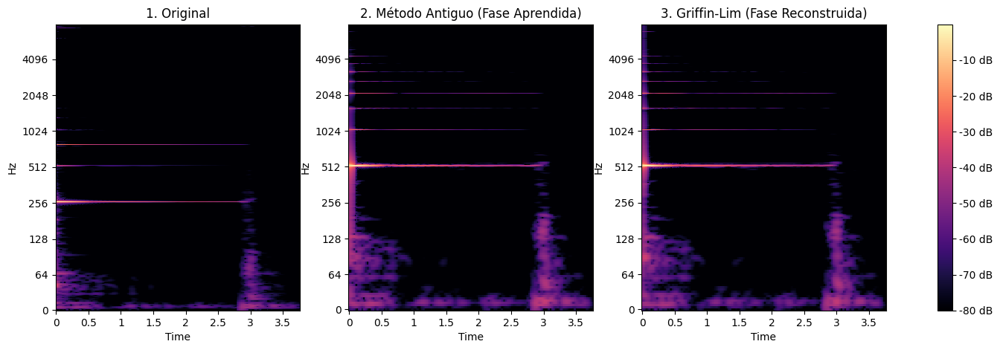

Original (keyboard_electronic_001-072-100):


Método Antiguo (Fase del Modelo) - ¿Suena robótico?:


Método Griffin-Lim - ¿Suena más limpio?:



Test sample index: 3406


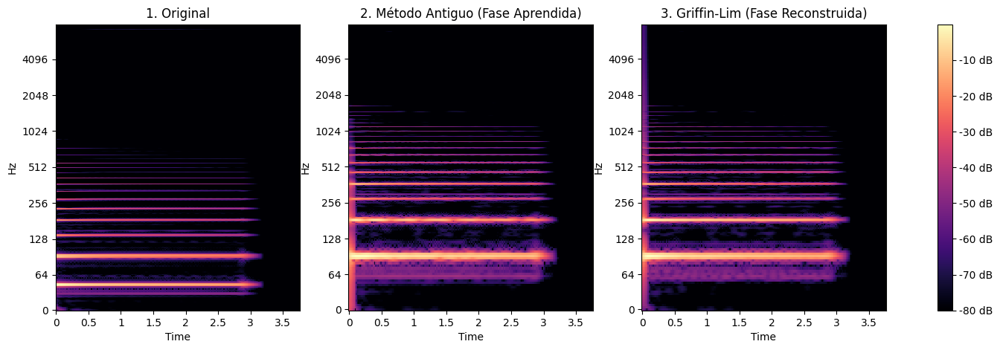

Original (guitar_electronic_022-042-025):


Método Antiguo (Fase del Modelo) - ¿Suena robótico?:


Método Griffin-Lim - ¿Suena más limpio?:



Test sample index: 1264


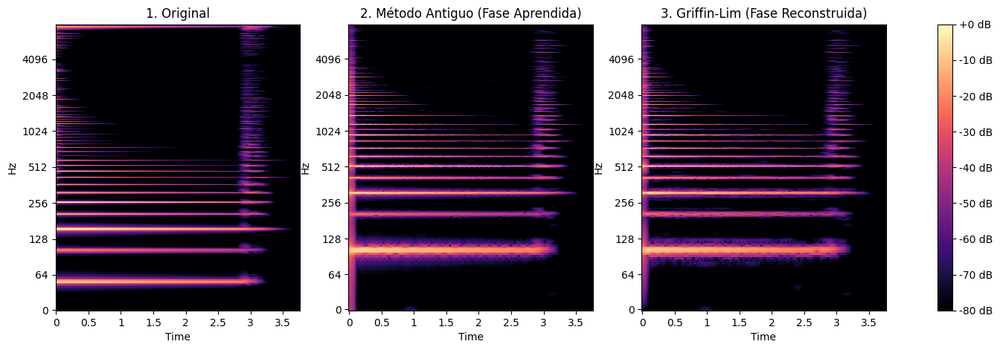

Original (guitar_acoustic_015-044-100):


Método Antiguo (Fase del Modelo) - ¿Suena robótico?:


Método Griffin-Lim - ¿Suena más limpio?:


In [4]:
import matplotlib.pyplot as plt
import librosa.display
import torch.nn.functional as F

# --- Configuración Inicial ---
model.eval()
test_indices = [random.choice(range(len(test_dataset))) for _ in range(3)] # Probamos con 3 para no saturar

# Definimos Griffin-Lim una sola vez
griffin_lim = torchaudio.transforms.GriffinLim(
    n_fft=4000,        
    hop_length=300,    
    n_iter=32,
    power=1
).to(device)

# Función auxiliar para limpiar audio (quita NaNs y normaliza)
def clean_audio(waveform_tensor):
    audio_np = waveform_tensor.squeeze().detach().cpu().numpy()
    audio_np = np.nan_to_num(audio_np) # Quitar infinitos/NaNs
    max_val = np.abs(audio_np).max()
    if max_val > 0:
        audio_np = audio_np / max_val
    return audio_np

print("=== INICIANDO COMPARATIVA: FASE APRENDIDA vs GRIFFIN-LIM ===")

for idx in test_indices:
    print(f"\n{'='*60}")
    print(f"Test sample index: {idx}")
    _, sample_rate, key, metadata = test_dataset[idx]

    # 1. CARGAR AUDIO ORIGINAL
    raw_waveform, raw_sr = load_raw_waveform("testing", key)
    
    # Preparar tensores
    if raw_waveform.ndim == 2:
        raw_waveform = raw_waveform.unsqueeze(0)
    raw_waveform = raw_waveform.to(device)

    # Transformada STFT
    stft_spec = stft_transform(raw_waveform)
    mag, phase = compute_magnitude_and_phase(stft_spec)
    
    # Prepara entrada (Asumiendo que usaste Log en training)
    # SI TU MODELO NO USA LOG, DESCOMENTA LA LINEA DE ABAJO Y COMENTA LAS OTRAS DOS
    # input_data = torch.cat([magnitude, phase], dim=1).to(device) 
    input_log_magnitude = torch.log1p(mag)
    x = torch.cat([input_log_magnitude, phase], dim=1).to(device)

    # 2. INFERENCIA DEL MODELO
    with torch.no_grad():
        output_data = model(x)

    # Separar salidas
    pred_log_mag = output_data[:, 0, :, :]
    pred_phase   = output_data[:, 1, :, :]

    # Auto-detectar si necesitamos quitar logaritmo
    if pred_log_mag.max() < 20: 
        pred_mag = torch.expm1(pred_log_mag)
    else:
        pred_mag = pred_log_mag

    # ==========================================
    # MÉTODO 1: ANTIGUO (Usando Fase del Modelo)
    # ==========================================
    # Recombinar magnitud predicha + fase predicha
    recon_complex = pred_mag * torch.exp(1j * pred_phase)
    # ISTFT (Asegúrate de que istft_transform use los mismos params: 4000/300)
    wav_model_tensor = istft_transform(recon_complex)
    wav_model_clean  = clean_audio(wav_model_tensor)

    # ==========================================
    # MÉTODO 2: NUEVO (Griffin-Lim)
    # ==========================================
    # Cortar frecuencias sobrantes (Fix 4000 vs 2001)
    n_freqs_validas = 4000 // 2 + 1
    pred_mag_gl = pred_mag[:, :n_freqs_validas, :]
    
    # Generar
    wav_gl_tensor = griffin_lim(pred_mag_gl)
    wav_gl_clean  = clean_audio(wav_gl_tensor)

    # ==========================================
    # VISUALIZACIÓN (Re-analizando el audio generado)
    # ==========================================
    # Para ser justos, calculamos el espectrograma DE LO QUE SUENA
    # Usamos librosa para pintar rápido
    
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))
    
    # A) Original
    spec_orig = librosa.amplitude_to_db(mag.squeeze().cpu().numpy(), ref=np.max)
    librosa.display.specshow(spec_orig, sr=raw_sr, hop_length=300, x_axis='time', y_axis='log', ax=axs[0])
    axs[0].set_title("1. Original")
    
    # B) Modelo (Fase Aprendida) - Re-calculamos STFT del audio generado para ver fallos reales
    stft_model = librosa.stft(wav_model_clean, n_fft=4000, hop_length=300)
    spec_model = librosa.amplitude_to_db(np.abs(stft_model), ref=np.max)
    librosa.display.specshow(spec_model, sr=raw_sr, hop_length=300, x_axis='time', y_axis='log', ax=axs[1])
    axs[1].set_title("2. Método Antiguo (Fase Aprendida)")
    
    # C) Griffin-Lim
    stft_gl = librosa.stft(wav_gl_clean, n_fft=4000, hop_length=300)
    spec_gl = librosa.amplitude_to_db(np.abs(stft_gl), ref=np.max)
    img = librosa.display.specshow(spec_gl, sr=raw_sr, hop_length=300, x_axis='time', y_axis='log', ax=axs[2])
    axs[2].set_title("3. Griffin-Lim (Fase Reconstruida)")
    
    plt.colorbar(img, ax=axs, format='%+2.0f dB')
    plt.show()

    # ==========================================
    # REPRODUCCIÓN
    # ==========================================
    print(f"Original ({key}):")
    display(Audio(raw_waveform.squeeze().cpu().numpy(), rate=raw_sr))
    
    print("Método Antiguo (Fase del Modelo) - ¿Suena robótico?:")
    display(Audio(wav_model_clean, rate=raw_sr))
    
    print("Método Griffin-Lim - ¿Suena más limpio?:")
    display(Audio(wav_gl_clean, rate=raw_sr))